In [1]:
codes_repo = '/home/shayan/phoenix/marrovision/'
warehouse_repo = '/home/shayan/warehouse/marrovision/'

In [2]:
import torch
import os
import sys
import plotly_express as px
import pandas
from tqdm import tqdm
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

/home/shayan/anaconda3/envs/vision/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
ckpt = torch.load(os.path.join(warehouse_repo, 'ssl/swav/exp1/swav-200ep-bmc/swav/ofqj5eqe/swav-200ep-bmc-ofqj5eqe-ep=199.ckpt'), map_location='cpu')
prototypes = ckpt['state_dict']['prototypes.weight_v'].data.cpu().numpy()
kmeans = KMeans(n_clusters=10, random_state=0).fit(prototypes)
pca_embeds = PCA(n_components=3).fit_transform(prototypes)

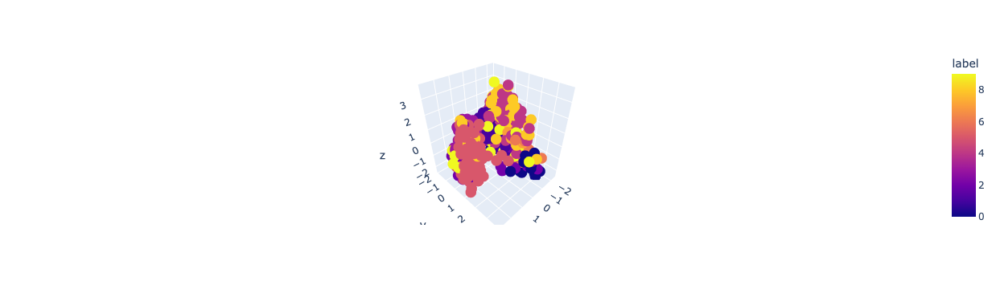

In [4]:
px.scatter_3d(pandas.DataFrame(dict(
    x=pca_embeds[:, 0],
    y=pca_embeds[:, 1],
    z=pca_embeds[:, 2],
    label=kmeans.labels_
)), x='x', y='y', z='z', color='label')

In [5]:
linear_ckpt = torch.load('/home/shayan/warehouse/sololearn/linear/temp_logs_for_current_experiment/linear_epoch=46.pth', map_location='cpu')

In [6]:
linear_ckpt['epoch_targets'].shape

(34281,)

In [7]:
pca_embeds = PCA(n_components=2).fit_transform(linear_ckpt['epoch_features'])
tsne_embeds = TSNE(n_components=2).fit_transform(linear_ckpt['epoch_features'])

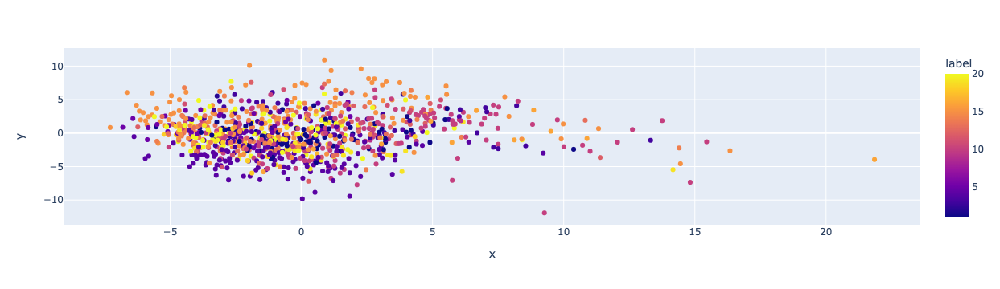

In [8]:
fig1 = px.scatter(pandas.DataFrame(dict(
    x=pca_embeds[:, 0],
    y=pca_embeds[:, 1],
    label=linear_ckpt['epoch_targets']
)).sample(1000), x='x', y='y', color='label')
fig1.show()

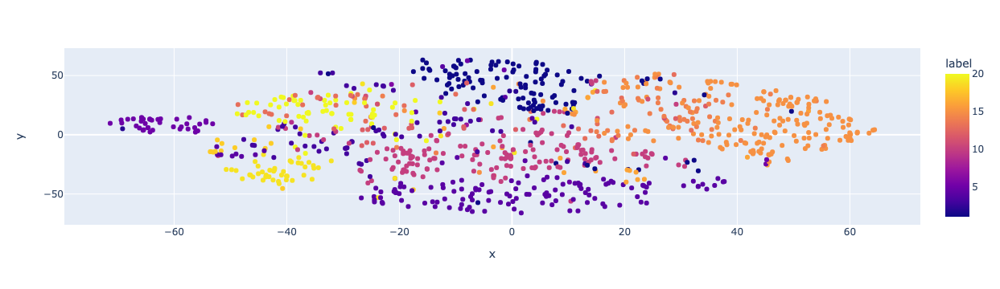

In [9]:
fig2 = px.scatter(pandas.DataFrame(dict(
    x=tsne_embeds[:, 0],
    y=tsne_embeds[:, 1],
    label=linear_ckpt['epoch_targets']
)).sample(1000), x='x', y='y', color='label')
fig2.show()

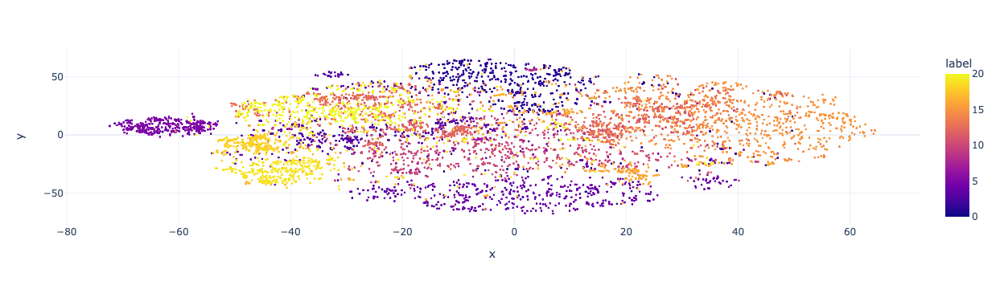

In [26]:
fig3 = px.scatter(pandas.DataFrame(dict(
    x=tsne_embeds[:, 0],
    y=tsne_embeds[:, 1],
    label=linear_ckpt['epoch_targets'],
)).groupby('label').sample(500, replace=True).reset_index(), x='x', y='y', color='label', template='plotly_white')
fig3.update_traces(marker=dict(size=3))
fig3.show()

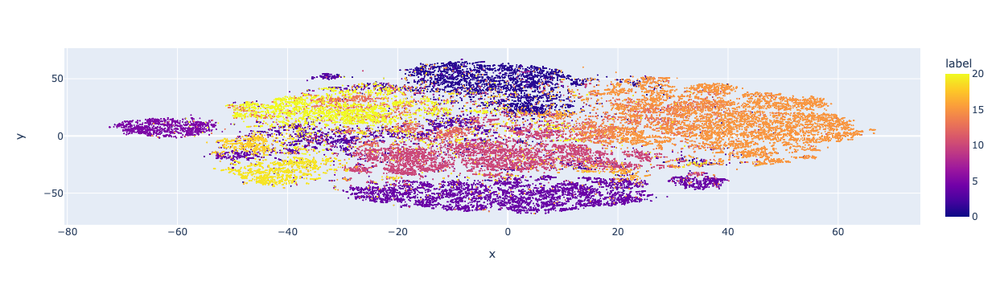

In [25]:
fig4 = px.scatter(pandas.DataFrame(dict(
    x=tsne_embeds[:, 0],
    y=tsne_embeds[:, 1],
    label=linear_ckpt['epoch_targets']
)).reset_index(), x='x', y='y', color='label')
fig4.update_traces(marker=dict(size=2))
fig4.show()

In [27]:
fig3.write_image('tsne_500samplewithreplacement.pdf', height=500, width=500)